# 5.4 컨브넷 학습 시각화
1. 컨브넷 중간층의 출력을 시각화하기
2. 컨브넷 필터를 시각화하기
3. 클래스 활성화에 대한 히트맵을 이미지에 시각화하기

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 5.4.1 중간층의 활성화 시각화

In [ ]:
# 5.2절에서 학습시켰던 모델 (데이터 증식, 드롭아웃)
from keras.models import load_model

  
model = load_model('/content/cats_and_dogs_small_2.h5')
    # keras.models의 load_model로 save_model한 모델을 불러온다

model.summary()
    # 기억을 살리기 위해 summary를 찍어본다
    # 4개의 컨브+맥스풀링  + Flatten + Dropout + 2개의 Dense층

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 72, 72, 32)        9248      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 36, 36, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 34, 34, 32)        9248      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 17, 17, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 15, 15, 32)       

In [ ]:
# 5-25 개별 이미지 전처리하기
img_path = '/content/drive/My Drive/Colab Notebooks/DLWP/cats_and_dogs_small/test/cats/cat.1700.jpg'

from keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150,150)) # PIL image instances를 반환, (path, gray_scale, color_mode, target_size, interpolation)
img_tensor = image.img_to_array(img)                  # PIL image instances를 Numpy array로 반환 
print('expand 전:',img_tensor.shape)

img_tensor = np.expand_dims(img_tensor, axis=0) # 이미지를 4D 텐서로 변경, 맨 앞 차원에 1이 생김, 이미지 1개를 한차원 늘려서 보는 거라 맨앞(sample)이 1
img_tensor /= 255.                              # 훈련할 때 하던 전처리 방식 그대로 사용

print('expand 후:',img_tensor.shape)

expand 전: (150, 150, 3)
expand 후: (1, 150, 150, 3)


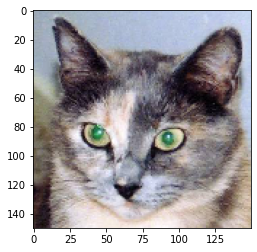

In [ ]:
# 5-26 테스트 사진 출력하기
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0]) # img_tensor가 4D이므로 인덱싱으로 차원을 하나 벗겨서 3D로 입력값에 전달
plt.show()

In [ ]:
model.layers

In [ ]:
# 5-27 입력 텐서와 출력 텐서의리스트로 모델 객체 만들기

from keras import models   # 모든 합성곱과 풀링 층의 활성화를 출력하는 케라스 모델
                           # Sequential과는 달리 여러 출력을 가진 모델 생성 가능
                           # 자세한 내용은 7.1절 참고
layer_outputs = [layer.output for layer in model.layers[:8]] # Conv2D+MaxPooling2D 총 4셋트가 있는 8개의 층에서, 각 층의 output들을 리스트에 저장
activation_model = models.Model(inputs = model.input, outputs = layer_outputs)  # 입력에 대해 8개의 층을 반환하는 모델 생성, 원래 입출 1개씩이었는데 여긴 출력 8개

In [ ]:
# 5-28 예측 모드로 모델 실행하기
activations = activation_model.predict(img_tensor) # 각 층이 활성화 될 때 마다 출력이 넘파이 배열로 반환

In [ ]:
first_layer_activation=activations[0] 
print(first_layer_activation.shape) # 원래 (1,150,150,3)이었는데 filter 크기가 3x3이라 가로,세로가 2씩 줄어듬.

(1, 148, 148, 32)


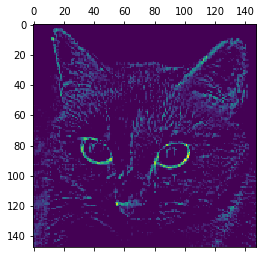

In [ ]:
# 5-29 20번째 채널 시각화하기             총 32개의 채널 중에서 20번째 채널
# 대각선 에지를 감지하도록 인코딩된 채널
import matplotlib.pyplot as plt
plt.matshow(first_layer_activation[0,:,:,19],cmap = 'viridis')

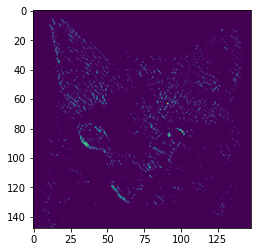

In [ ]:
# 5-30 16번째 채널 시각화하기             총 32개의 채널 중에서 20번째 채널
# 밝은 녹색 점을 감지하는 채널
plt.imshow(first_layer_activation[0,:,:,15],cmap='viridis')

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 72, 72, 32)        9248      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 36, 36, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 34, 34, 32)        9248      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 17, 17, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 15, 15, 32)       

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide


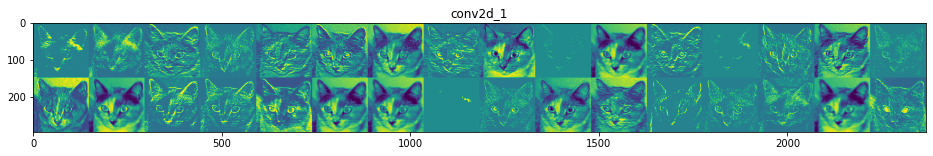

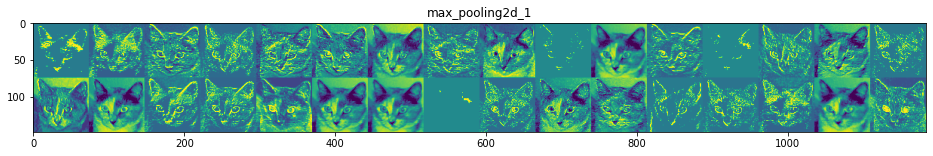

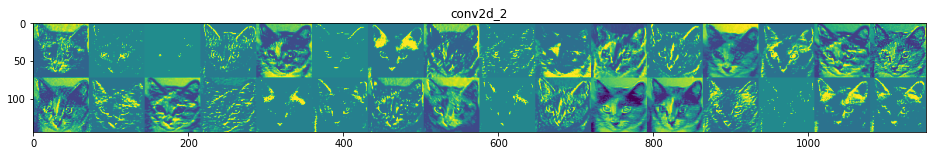

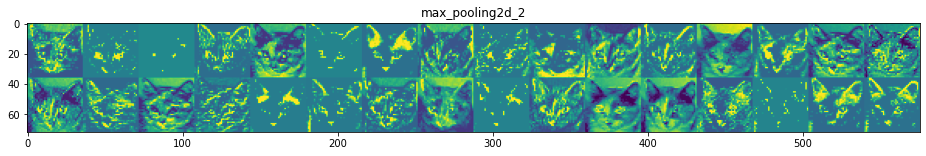

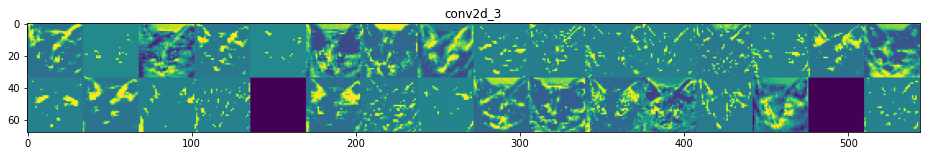

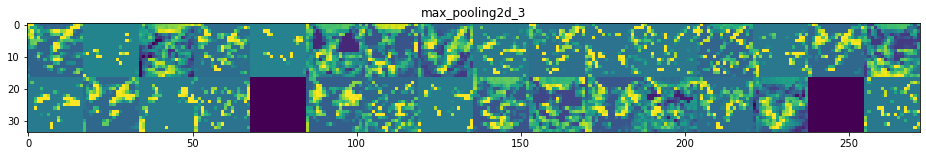

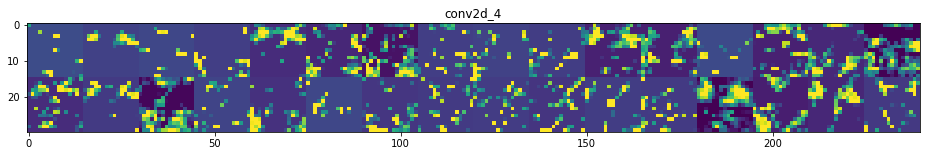

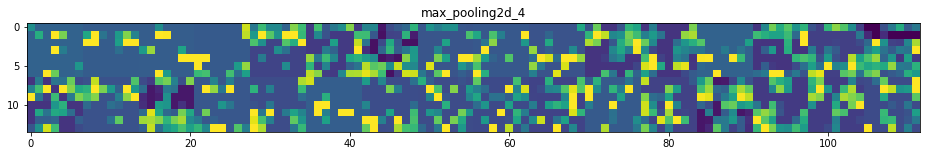

In [ ]:
# 5-31 중간층의 모든 활성화에 있는 채널 시각화하기
layer_names =[]
for layer in model.layers[:8]:
  layer_names.append(layer.name)

images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations):
  n_features = layer_activation.shape[-1]

  size = layer_activation.shape[1]
  n_cols = n_features // images_per_row
  display_grid = np.zeros((size * n_cols, images_per_row * size))

  for col in range(n_cols):
    for row in range(images_per_row):
      channel_image = layer_activation[0,:,:,col * images_per_row + row]
      channel_image -= channel_image.mean()
      channel_image /= channel_image.std()
      channel_image *= 64
      channel_image += 128
      channel_image = np.clip(channel_image,0,255).astype('uint8')
      display_grid[col * size : (col + 1) * size,
                   row * size : (row + 1) * size] = channel_image

  scale = 1./size
  plt.figure(figsize=(scale * display_grid.shape[1],
                    scale * display_grid.shape[0]))
  plt.title(layer_name)
  plt.grid(False)
  plt.imshow(display_grid,aspect='auto', cmap='viridis')
plt.show()

## 5.4.2 컨브넷 필터 시각화

In [ ]:
# 5-32
from keras.applications import VGG16
from keras import backend as K

model = VGG16(weights='imagenet',
              include_top=False)

layer_name = 'block3_conv1'
filter_index = 0

layer_output = model.get_layer(layer_name).output
loss = K.mean(layer_output[:, :, :, filter_index])

In [ ]:
import tensorflow as tf
print(tf.__version__)
tf.executing_eagerly()

2.3.0


False

In [ ]:
tf.compat.v1.enable_eager_execution()
grads1 = K.gradients(loss,model.input)[0]

ValueError: ignored

In [ ]:
tf.compat.v1.disable_eager_execution()

In [ ]:
# 5-33 입력에 대한 손실의 그래디언트 구하기
grads = K.gradients(loss, model.input)[0]

In [ ]:
# 5-34 그래디언트 정규화하기
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

In [ ]:
# 5-35 입력 값에 대한 넘파이 출력 값 추출하기
iterate = K.function([model.input],[loss, grads])

import numpy as np
loss_value, grads_value = iterate([np.zeros((1,150,150,3))])

In [ ]:
# 5-36 확률적 경사 상승법을 사용한 손실 최대화하기
input_img_data = np.random.random((1,150,150,3)) * 20 + 128.
step = 1.
for i in range(40):
  loss_value,grads_value = iterate([input_img_data])

  input_img_data += grads_value * step

In [ ]:
# 5-37 텐서를 이미지 형태로 변환하기 위한 유틸리티 함수 (코드 5-31과 유사, 표준 점수 5배수 이내에 있는 값들을 0~255로 압축)
def deprocess_imgae(x):
  x -= x.mean()
  x /= (x.std() + 1e-5)
  x *= 0.1

  x += 0.5
  x = np.clip(x,0,1)

  x *= 255
  x = np.clip(x, 0, 255).astype('uint8')
  return x

In [ ]:
# 5-38 필터 시각화 이미지를 만드는 함수
def generate_pattern(layer_name, filter_index, size=150):
  layer_output = model.get_layer(layer_name).output
  loss = K.mean(layer_output[:,:,:,filter_index])

  grads = K.gradients(loss, model.input)[0]
  grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

  iterate = K.function([model.input], [loss, grads])
  input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.
  step = 1.
  for i in range(40):
    loss_value, grads_value = iterate([input_img_data])
    input_img_data += grads_value * step
  
  img = input_img_data[0]
  return deprocess_imgae(img)

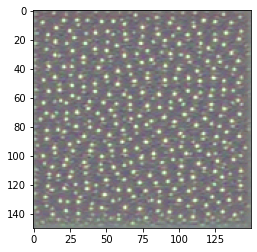

In [ ]:
plt.imshow(generate_pattern('block3_conv1',0))

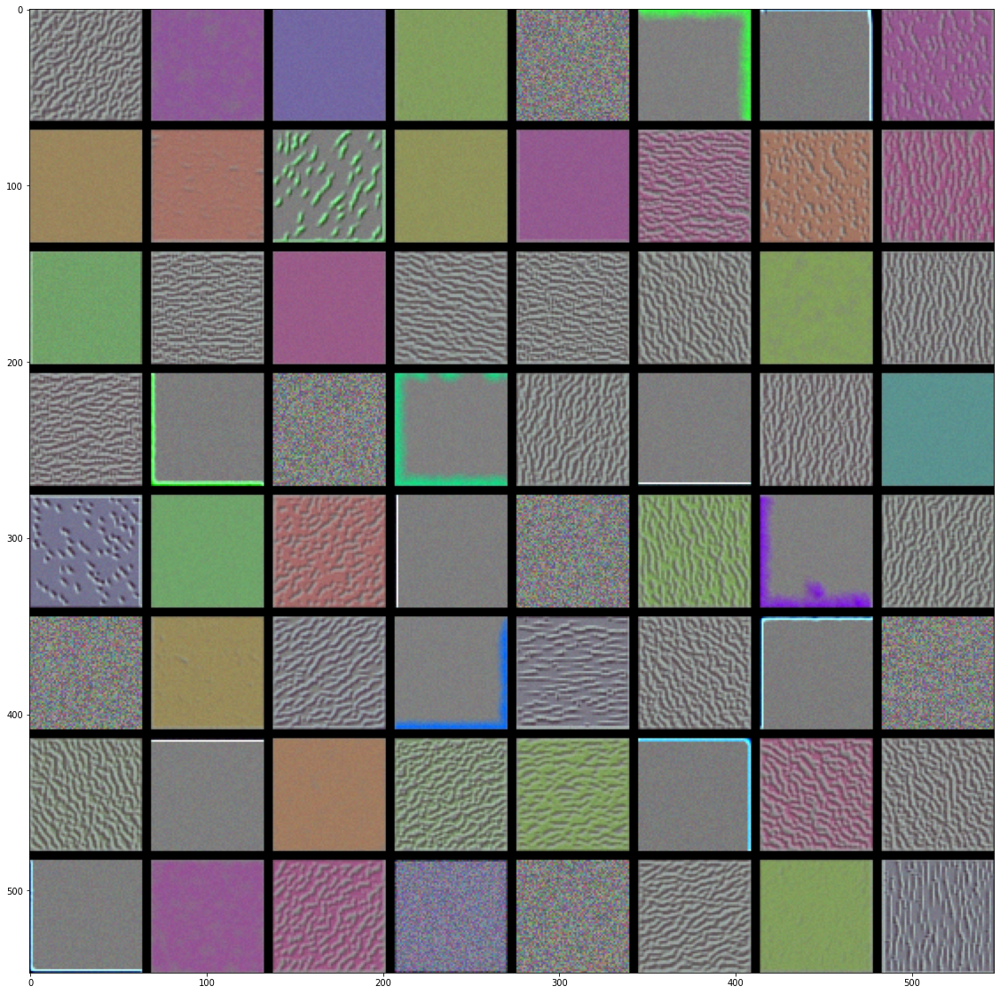

In [ ]:
# 5-39 층에 있는 각 필터에 반응하는 패턴 생성하기
layer_name = 'block1_conv1'
size = 64
margin = 5

results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin,3), dtype = 'uint8')

for i in range(8):
  for j in range(8):
    filter_img = generate_pattern(layer_name, i + (j * 8), size=size)
    horizontal_start = i*size + i*margin
    horizontal_end = horizontal_start + size
    vertical_start = j * size + j * margin
    vertical_end = vertical_start + size
    results[horizontal_start:horizontal_end,
            vertical_start:vertical_end,:] = filter_img

plt.figure(figsize=(20,20))
plt.imshow(results)

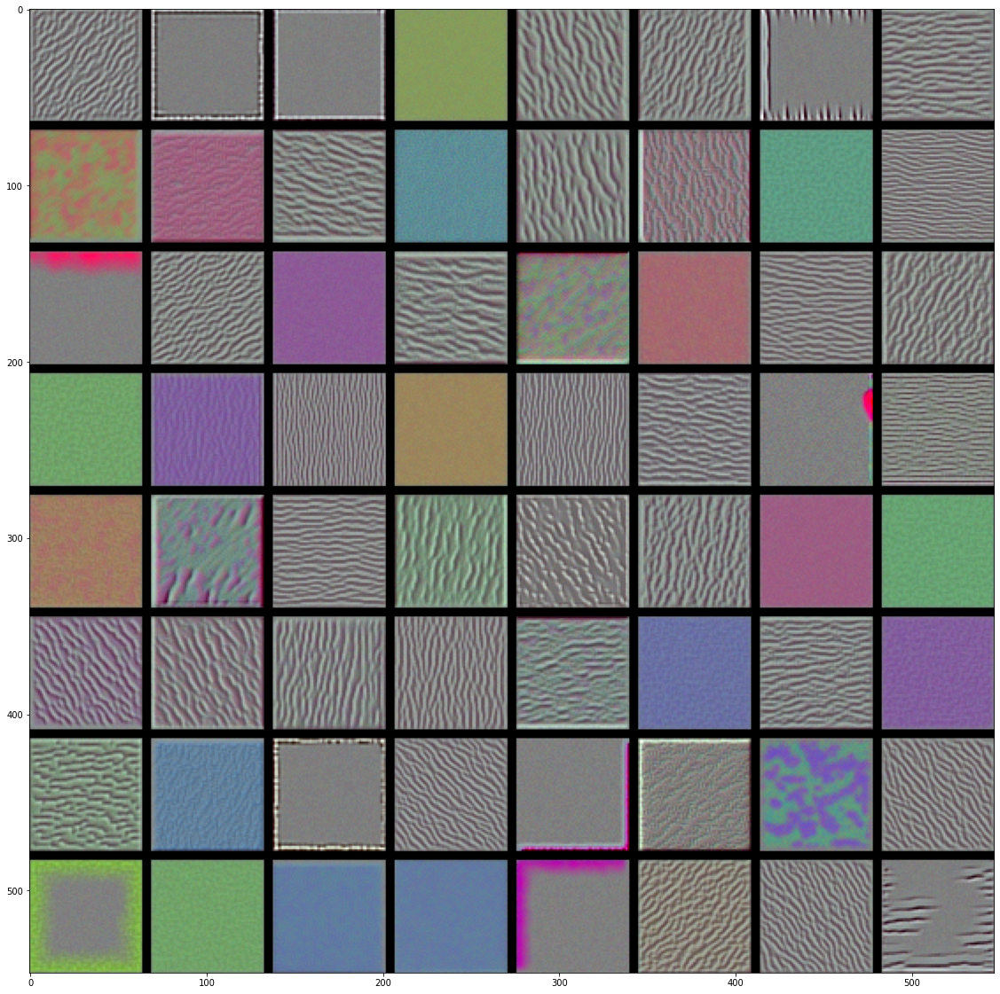

In [ ]:
# 5-39 층에 있는 각 필터에 반응하는 패턴 생성하기
layer_name = 'block1_conv2'
size = 64
margin = 5

results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin,3), dtype = 'uint8')

for i in range(8):
  for j in range(8):
    filter_img = generate_pattern(layer_name, i + (j * 8), size=size)
    horizontal_start = i*size + i*margin
    horizontal_end = horizontal_start + size
    vertical_start = j * size + j * margin
    vertical_end = vertical_start + size
    results[horizontal_start:horizontal_end,
            vertical_start:vertical_end,:] = filter_img

plt.figure(figsize=(20,20))
plt.imshow(results)

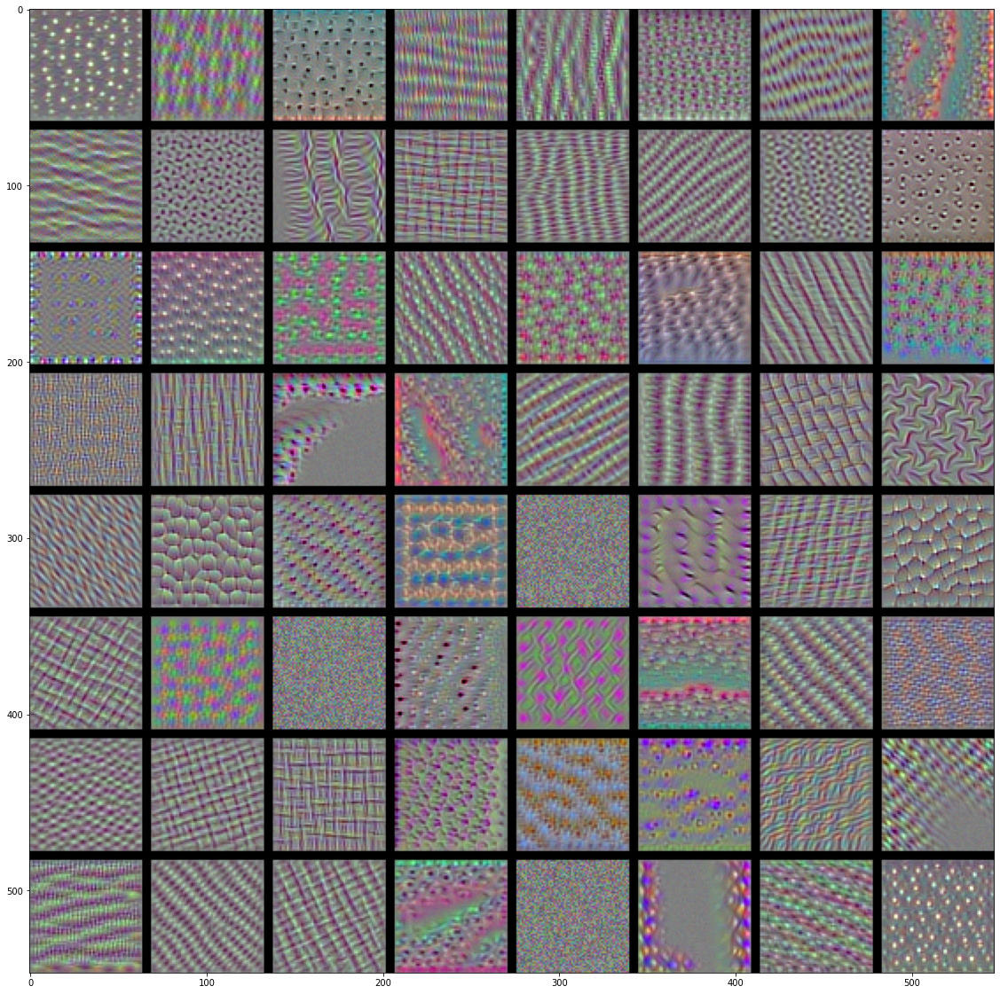

In [ ]:
layer_name = 'block3_conv1'
size = 64
margin = 5

results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin,3), dtype = 'uint8')

for i in range(8):
  for j in range(8):
    filter_img = generate_pattern(layer_name, i + (j * 8), size=size)
    horizontal_start = i*size + i*margin
    horizontal_end = horizontal_start + size
    vertical_start = j * size + j * margin
    vertical_end = vertical_start + size
    results[horizontal_start:horizontal_end,
            vertical_start:vertical_end,:] = filter_img

plt.figure(figsize=(20,20))
plt.imshow(results)

## 5.4.3 클래스 활성화에 대한 히트맵을 이미지에 시각화하기

In [ ]:
# 5-40 사전 훈려된 가중치로 VGG16 네트워크 로드하기
from keras.applications.vgg16 import VGG16

model = VGG16(weights = 'imagenet')

553467904/553467096 [==============================] - 3s 0us/step


In [ ]:
# 5-41 VGG16을 위해 입력 이미지 전처리하기
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

img_path = '/content/creative_commons_elephant.jpg'

img = image.load_img(img_path, target_size=(224,224))

x = image.img_to_array(img)

x = np.expand_dims(x,axis=0)

x = preprocess_input(x)

In [ ]:
preds = model.predict(x)
print('Predicted:',decode_predictions(preds,top=3)[0])

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
40960/35363 [==================================] - 0s 0us/step
Predicted: [('n02504458', 'African_elephant', 0.90942144), ('n01871265', 'tusker', 0.08618243), ('n02504013', 'Indian_elephant', 0.0043545677)]


In [ ]:
np.argmax(preds[0])

386

In [ ]:
# 5-42 Grad-CAM 알고리즘 설정하기
african_elephant_output = model.output[:,386]

last_conv_layer = model.get_layer('block5_conv3')

grads = K.gradients(african_elephant_output, last_conv_layer.output)[0]

pooled_grads = K.mean(grads, axis=(0,1,2))

iterate = K.function([model.input],
                     [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([x])

for i in range(512):
  conv_layer_output_value[:,:,i] *= pooled_grads_value[i]

heatmap = np.mean(conv_layer_output_value, axis=-1)

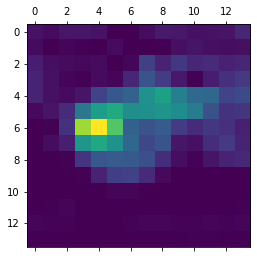

In [ ]:
# 5-43 히트맵 후처리하기
heatmap = np.maximum(heatmap,0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)

In [ ]:
# 5-44 원본 이미지에 히트맵 덧붙이기
import cv2
img = cv2.imread(img_path)

heatmap = cv2.resize(heatmap, (img.shape[1],img.shape[0]))

heatmap = np.uint8(255 * heatmap)

heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

superimposed_img = heatmap * 0.4 + img

cv2.imwrite('elephant_cam.jpg',superimposed_img)

True

In [ ]:
from PIL import Image
Image.open('/content/elephant_cam.jpg').show()

In [ ]:
superimposed_img

array([[[304.4, 214. , 196. ],
        [303.4, 213. , 195. ],
        [303.4, 213. , 195. ],
        ...,
        [314.4, 201. , 188. ],
        [314.4, 201. , 188. ],
        [314.4, 201. , 188. ]],

       [[304.4, 214. , 196. ],
        [304.4, 214. , 196. ],
        [303.4, 213. , 195. ],
        ...,
        [313.4, 200. , 187. ],
        [313.4, 200. , 187. ],
        [313.4, 200. , 187. ]],

       [[304.4, 214. , 196. ],
        [304.4, 214. , 196. ],
        [303.4, 213. , 195. ],
        ...,
        [313.4, 200. , 187. ],
        [313.4, 200. , 187. ],
        [313.4, 200. , 187. ]],

       ...,

       [[149.2, 151. , 142. ],
        [108.2, 110. , 101. ],
        [ 97.2, 102. ,  91. ],
        ...,
        [107.2,  96. ,  91. ],
        [136.2, 125. , 120. ],
        [131.2, 120. , 115. ]],

       [[117.2, 121. , 112. ],
        [ 95.2, 100. ,  89. ],
        [116.2, 124. , 110. ],
        ...,
        [126.2, 115. , 110. ],
        [132.2, 121. , 116. ],
        [113.2,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


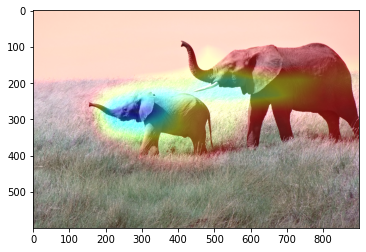

In [ ]:
plt.imshow(np.round(superimposed_img).astype('int'))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


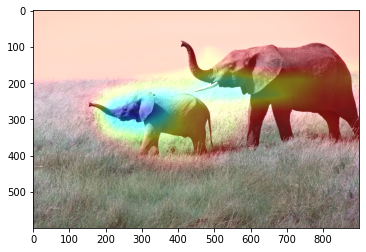

In [ ]:
# 원본은 이렇게 안 생겼는데 대충 이렇게 생김 ㅎㅎ
plt.imshow((superimposed_img/255.))